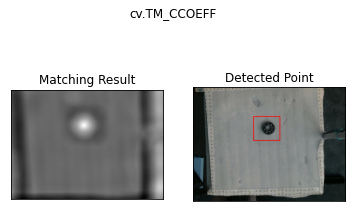

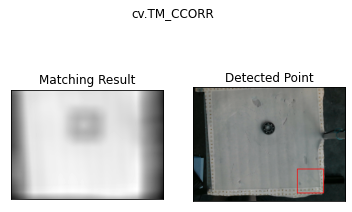

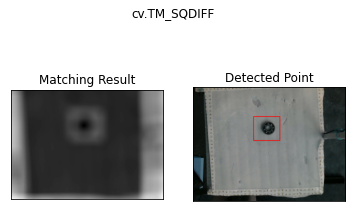

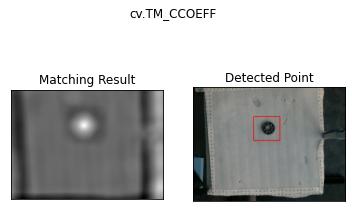

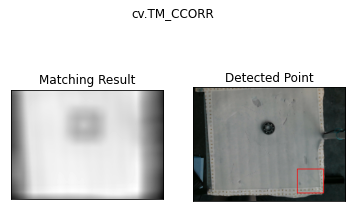

...

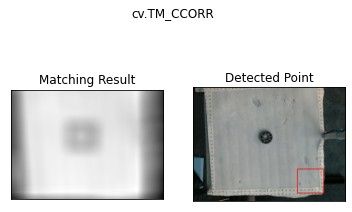

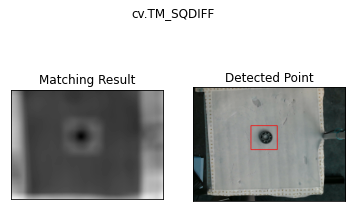

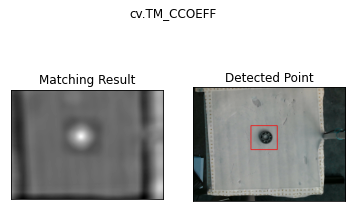

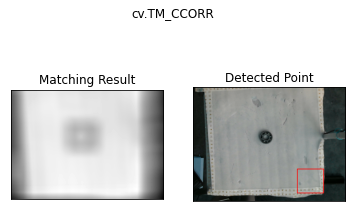

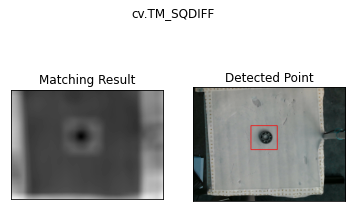

KeyboardInterrupt: 

In [2]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

#img_path="opencv_frame_0.png"
#img = cv.imread(img_path)
#plt.imshow(img)
videocapture = cv.VideoCapture(0)
while(True):
    ret, frame = videocapture.read()
    if not ret: break
   # cv.imshow("test",frame)
    img=frame.copy()
    img2 = img.copy()
    temp_path="savedImage1.png"
    template = cv.imread(temp_path)
#w, h = template.shape[::-1]
    (h,w)= template.shape[:2]

    methods = ['cv.TM_CCOEFF', 'cv.TM_CCORR', 'cv.TM_SQDIFF']
    for meth in methods:
        img = img2.copy()
        method = eval(meth)
    # Apply template Matching
        res = cv.matchTemplate(img,template,method)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
        if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv.rectangle(img,top_left, bottom_right, 255, 2)
        plt.subplot(121),plt.imshow(res,cmap = 'gray')
        plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
        plt.subplot(122),plt.imshow(img,cmap = 'gray')
        plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
        plt.suptitle(meth)
        plt.show()

In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

#img_path="opencv_frame_0.png"
#img = cv.imread(img_path)
#plt.imshow(img)
videocapture = cv.VideoCapture(0)
plt.ion()
while(True):
    ret, frame = videocapture.read()
    if not ret: break
    plt.imshow(frame)
    #if cv.waitKey(1) & 0xFF == ord('q'): break

plt.ioff()    
videocapture.release()
cv.destroyAllWindows()